In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree, metrics
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 200

In [18]:
features = ['kp_surf', 'brightness', 'contrast', 'area_by_perim', 
            'aspect_ratio', 'edge_length1', 'hue1']

def get_params(X, y):
    params = {"criterion":['gini', 'entropy'], "max_depth":range(1, 15), "min_samples_leaf":range(1, 30, 5)}
    cross_val = GridSearchCV(DecisionTreeClassifier(), params, cv=2).fit(X, y)
    return cross_val.best_params_

def get_scores(name, clf, X, y):
    pred = clf.predict(X)
    acc = round(metrics.accuracy_score(y, pred), 2)
    prec = round(metrics.precision_score(y, pred), 2)
    rec = round(metrics.recall_score(y, pred), 2)
    print('{}: accuracy : precision : recall = {} : {} : {}\n'.format(name, acc, prec, rec))
    return acc, prec, rec

def get_params2(X, y):
    params = {"C":[0.001, 0.01, 0.1, 1, 10, 100, 1000], "penalty":["l1","l2"], "solver":['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], "random_state": [0]}
    cross_val = GridSearchCV(LogisticRegression(), params, cv=2).fit(X, y)
    return cross_val.best_params_

# Dataset Ideas

<font size="3">Here I'm gonna create different datasets with 3 sample sizes and two main classes (MobileNet and Failed). The main restriction is the amount of Failed images, since we only have about 6.5k of them. The first group of datasets is gonna have the same amount of images for each class. The second one will have 80% of Mobilenet images, and 20% Failed. And the last one will have 80% Failed, and 20% Mobilenet.</font>

In [3]:
b = [(50, 50), (500, 500), (6500, 6500)]
u = [(80, 20), (800, 200), (10400, 2600)]
u_f = [(20, 80), (200, 800), (1625, 6500)]
bal = []
unbal_mob = []
unbal_fail = []

data = pd.read_csv('changed_local.csv')
#Find MobileNet and Failed Images

In [4]:
bal.append([data.iloc[[x-1 for x in [14, 23, 43, 75, 79, 89, 97, 99, 101, 113,
                      123, 130, 133, 143, 147, 149, 157, 158, 168, 174,
                      178, 188, 208, 211, 213, 223, 247, 266, 283, 314,
                      318, 328, 336, 344, 350, 356, 370, 375, 391, 399,
                      417, 441, 451, 477, 548, 554, 640, 710, 2040, 2477]]], 
            data.iloc[[x-1 for x in [17, 39, 50, 119, 121, 150, 151, 159, 185, 192, 
                      214, 226, 232, 239, 267, 269, 277, 279, 292, 295, 
                      310, 320, 331, 339, 345, 351, 360, 387, 389, 398, 
                      400, 484, 488, 492, 510, 543, 561, 566, 584, 652, 
                      654, 659, 677, 683, 707, 730, 750, 776, 804, 938]]]])

unbal_mob.append([data.iloc[[x-1 for x in [14, 23, 43, 75, 79, 89, 97, 99, 101, 113,
                      123, 130, 133, 143, 147, 149, 157, 158, 168, 174,
                      178, 188, 208, 211, 213, 223, 247, 266, 283, 314,
                      318, 328, 336, 344, 350, 356, 370, 375, 391, 399,
                      417, 441, 451, 477, 548, 554, 640, 710, 2040, 2477, 
                      2758, 2761, 2764, 2771, 2777, 2787, 2789, 2811, 2815, 2825,
                      2830, 2837, 2838, 2840, 2845, 2849, 2853, 2862, 2878, 2882, 
                      2889, 2908, 2929, 2931, 2932, 2948, 2953, 2955, 2967, 2975]]], 
            data.iloc[[x-1 for x in [17, 39, 50, 119, 121, 150, 151, 159, 185, 192, 
                      214, 226, 232, 239, 267, 269, 277, 279, 292, 295]]]])

unbal_fail.append([data.iloc[[x-1 for x in [14, 23, 43, 75, 79, 89, 97, 99, 101, 113,
                      123, 130, 133, 143, 147, 149, 157, 158, 168, 174]]], 
            data.iloc[[x-1 for x in [17, 39, 50, 119, 121, 150, 151, 159, 185, 192, 
                      214, 226, 232, 239, 267, 269, 277, 279, 292, 295, 
                      310, 320, 331, 339, 345, 351, 360, 387, 389, 398, 
                      400, 484, 488, 492, 510, 543, 561, 566, 584, 652, 
                      654, 659, 677, 683, 707, 730, 750, 776, 804, 938,
                      3699, 3715, 3746, 3757, 3777, 3804, 3817, 3884, 3847, 3864, 
                      3944, 3965, 3972, 4046, 4114, 4126, 4133, 4152, 4153, 4166, 
                      4188, 4236, 4241, 4297, 4541, 4607, 4633, 4681, 4759, 4922]]]])

In [5]:
mnet = data[data['Mobilenet_v1'] == 1]
failed = data[((data['Mobilenet_v1'] == 0) & 
            (data['Inception_v4'] == 0) & 
            (data['Resnet_v1_152'] == 0))]
for x, y, z in zip(b, u, u_f):
    bal.append([mnet.sample(x[0], random_state=1), failed.sample(x[1], random_state=1)])
    unbal_mob.append([mnet.sample(y[0], random_state=1), failed.sample(y[1], random_state=1)])
    unbal_fail.append([mnet.sample(z[0], random_state=1), failed.sample(z[1], random_state=1)])

In [6]:
import plotly.graph_objects as go
import plotly.express as px

i=0
titles = ['Small & Empirical Datasets', 'Medium Datasets', 'Large Datasets']
x = ['Balanced', 'Unbalanced (MobileNet)', 'Unbalanced (Failed)']
for a, b, c in zip(b, u, u_f):
    plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = x,
        y = [a[0], b[0], c[0]],
        text = ['MobileNet', 'MobileNet', 'MobileNet'], 
        textposition='auto'
       ),
                           go.Bar(
        name = 'Failed (Difficult)',
        x = x,
        y = [a[1], b[1], c[1]],
        text = ['Failed', 'Failed', 'Failed'], 
                               textposition='auto'

       )
    ])

    plot.update_layout(height=800, width=1000, paper_bgcolor='rgba(0,0,0,0)', title=titles[i], showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Number of Images")
    i += 1
    plot.show()

In [7]:
bal[0][0]

,filename,Mobilenet_v1,Inception_v4,Resnet_v1_152,kp_surf,average_perceived_brightness,contrast,area_by_perim,aspect_ratio,edge_length1,hue1
13,ILSVRC2012_val_00000014.JPEG,1,0,0,1501,143.335729,80.241978,94.771654,1.152542,264.000000,0.006896
22,ILSVRC2012_val_00000023.JPEG,1,0,0,579,214.739561,47.585577,221.571698,0.994477,122.400000,0.015329
42,ILSVRC2012_val_00000043.JPEG,1,0,0,998,94.458077,34.440492,78.006380,0.871642,123.000000,0.022665
74,ILSVRC2012_val_00000075.JPEG,1,0,0,402,115.535548,34.606203,56.719298,0.868852,172.000000,0.024081
78,ILSVRC2012_val_00000079.JPEG,1,0,0,5996,110.314420,42.165718,235.527792,0.904234,379.000000,0.020559
88,ILSVRC2012_val_00000089.JPEG,1,0,0,1191,138.004215,95.141222,128.791717,0.466120,160.000000,0.014441
96,ILSVRC2012_val_00000097.JPEG,1,0,0,274,93.073327,31.579684,44.019512,2.203125,77.000000,0.005875
98,ILSVRC2012_val_00000099.JPEG,1,0,0,799,118.426097,90.547310,208.696615,1.120308,88.166667,0.016897
100,ILSVRC2012_val_00000101.JPEG,1,0,0,556,196.906130,16.294441,143.769882,1.392713,232.000000,0.020536
112,ILSVRC2012_val_00000113.JPEG,1,0,0,1029,146.387076,69.380286,77.179487,1.228571,100.000000,0.021183


In [22]:
for it in range(3):
    print("Cross Validation #{}".format(it))
    for b in bal:
        train = pd.concat([b[0].head(int(len(b[0])*0.7)), b[1].head(int(len(b[1])*0.7))])
        test = pd.concat([b[0].tail(int(len(b[0])*0.3)), b[1].tail(int(len(b[1])*0.3))])
        X_train = train.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        X_test = test.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        y_train = train[['Mobilenet_v1']]
        y_test = test[['Mobilenet_v1']]
        params = get_params(X_train, y_train) 
        print(params)

Cross Validation #0
{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 16}
{'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 11}
{'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 1}
{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 6}
Cross Validation #1
{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 16}
{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 11}
{'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 1}
{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 11}
Cross Validation #2
{'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 16}
{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 11}
{'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 1}
{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 6}


In [28]:
len(bal[3][0])

6500

In [8]:
datasets = ['Balanced (Empirical)', 'Balanced (Small)', 'Balanced (Medium)', 'Balanced (Large)', 
            'Mobilenet (Empirical)','MobileNet (Small)', 'MobileNet (Medium)', 'MobileNet (Large)', 
            'Failed (Empirical)','Failed (Small)', 'Failed (Medium)', 'Failed (Large)']
i = 0
accs = []
precs = []
recs = []
trees = []
for a in [bal, unbal_mob]:
    for b in a:
        train = pd.concat([b[0].head(int(len(b[0])*0.7)), b[1].head(int(len(b[1])*0.7))])
        test = pd.concat([b[0].tail(int(len(b[0])*0.3)), b[1].tail(int(len(b[1])*0.3))])
        X_train = train.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        X_test = test.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        y_train = train[['Mobilenet_v1']]
        y_test = test[['Mobilenet_v1']]
        params = get_params(X_train, y_train)
        tree_model = DecisionTreeClassifier(criterion = params["criterion"], max_depth=params["max_depth"], 
                         min_samples_leaf = params["min_samples_leaf"]).fit(X_train, y_train)
        acc, prec, rec = get_scores(datasets[i], tree_model, X_test, y_test)
        trees.append(tree_model)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec)
        i += 1

Balanced (Empirical): accuracy : precision : recall = 0.6 : 0.67 : 0.4

Balanced (Small): accuracy : precision : recall = 0.5 : 0.5 : 0.73

Balanced (Medium): accuracy : precision : recall = 0.57 : 0.54 : 0.87

Balanced (Large): accuracy : precision : recall = 0.58 : 0.55 : 0.86

Mobilenet (Empirical): accuracy : precision : recall = 0.63 : 0.88 : 0.62

MobileNet (Small): accuracy : precision : recall = 0.5 : 0.74 : 0.58

MobileNet (Medium): accuracy : precision : recall = 0.8 : 0.8 : 1.0

MobileNet (Large): accuracy : precision : recall = 0.8 : 0.8 : 1.0



In [9]:
for a in [unbal_fail]:
    for b in a:
        train = pd.concat([b[0].head(int(len(b[0])*0.7)), b[1].head(int(len(b[1])*0.7))])
        test = pd.concat([b[0].tail(int(len(b[0])*0.3)), b[1].tail(int(len(b[1])*0.3))])
        X_train = train.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        X_test = test.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        y_train = train[['Mobilenet_v1']]
        y_test = test[['Mobilenet_v1']]
        y_train['Mobilenet_v1'] = y_train['Mobilenet_v1'].replace({0:1, 1:0})
        y_test['Mobilenet_v1'] = y_test['Mobilenet_v1'].replace({0:1, 1:0})
        params = get_params(X_train, y_train)
        tree_model = DecisionTreeClassifier(criterion = params["criterion"], max_depth=params["max_depth"], 
                         min_samples_leaf = params["min_samples_leaf"]).fit(X_train, y_train)
        acc, prec, rec = get_scores(datasets[i], tree_model, X_test, y_test)
        trees.append(tree_model)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec)
        i += 1

Failed (Empirical): accuracy : precision : recall = 0.73 : 0.76 : 0.96

Failed (Small): accuracy : precision : recall = 0.8 : 0.8 : 1.0

Failed (Medium): accuracy : precision : recall = 0.8 : 0.8 : 1.0

Failed (Large): accuracy : precision : recall = 0.8 : 0.8 : 1.0



In [10]:
plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = datasets,
        y = accs
       )])

plot.update_layout(paper_bgcolor='rgba(0,0,0,0)', showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Accuracy")

plot.show()

plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = datasets,
        y = precs
       )])

plot.update_layout(paper_bgcolor='rgba(0,0,0,0)', showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Precision")

plot.show()

plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = datasets,
        y = recs
       )])

plot.update_layout(paper_bgcolor='rgba(0,0,0,0)', showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Recall")

plot.show()

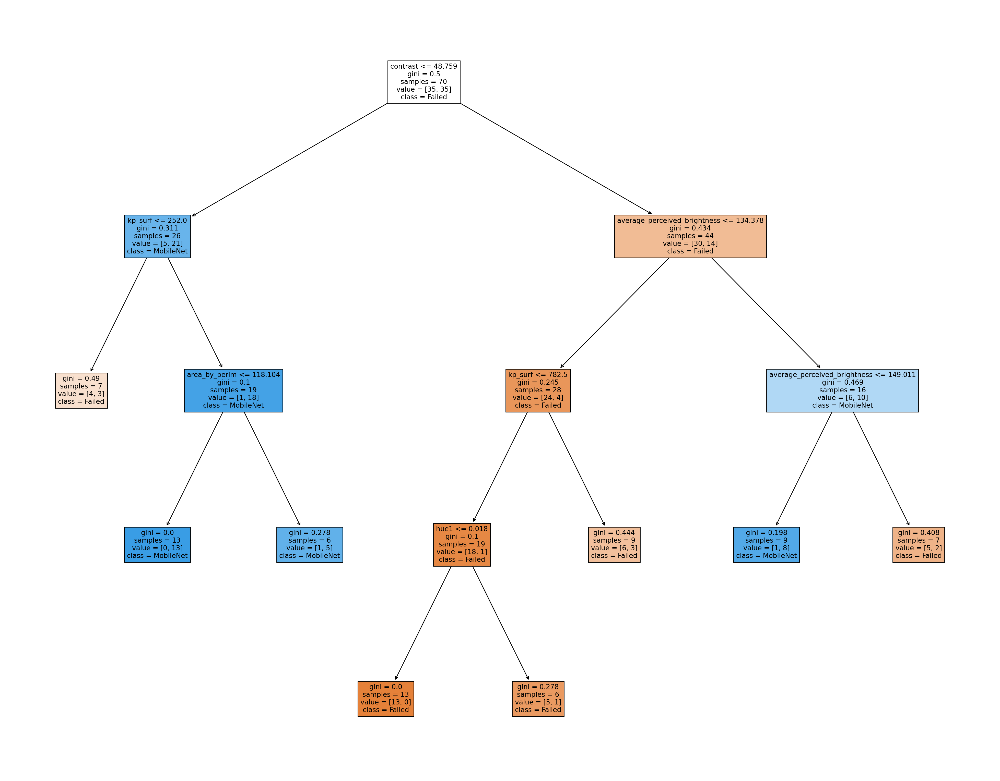

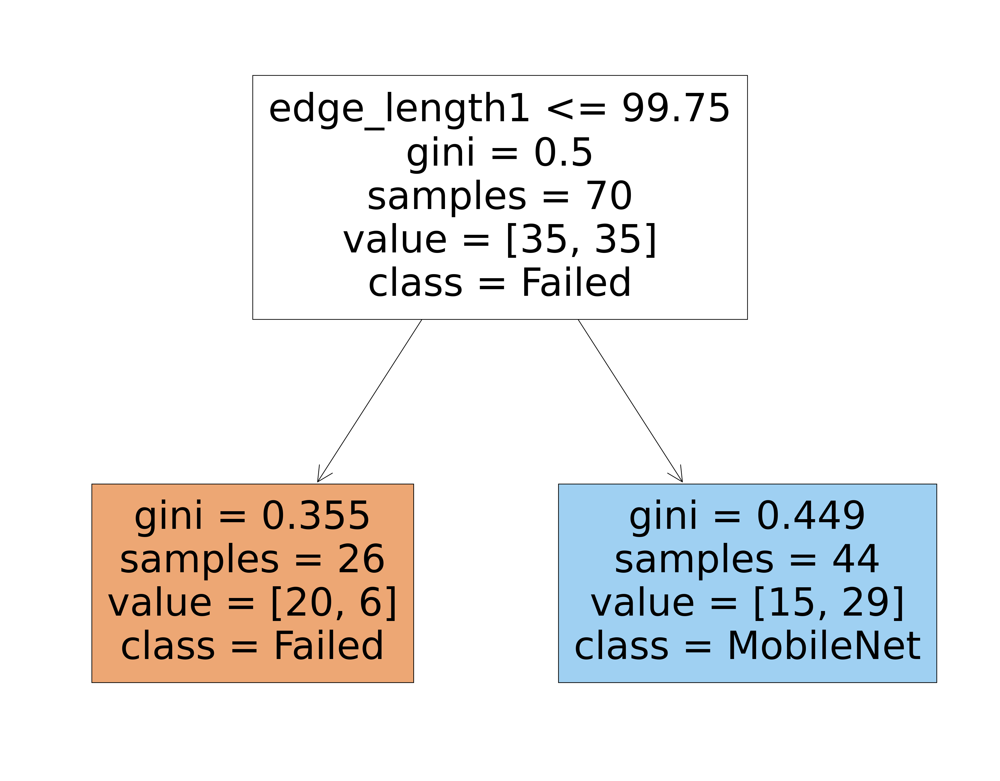

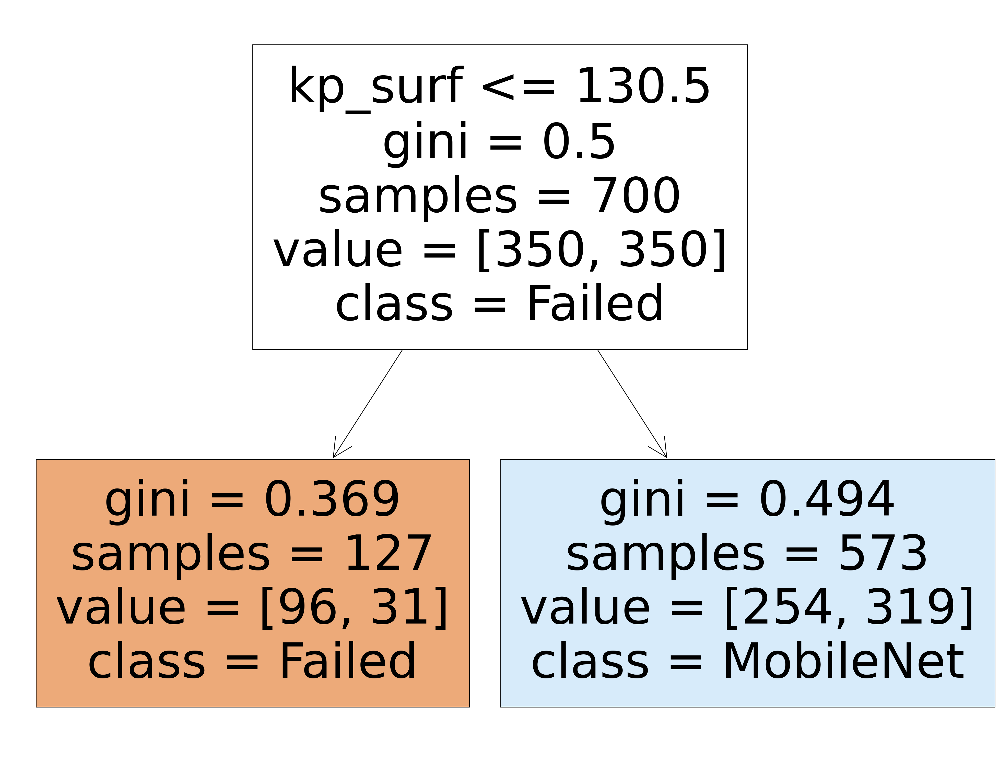

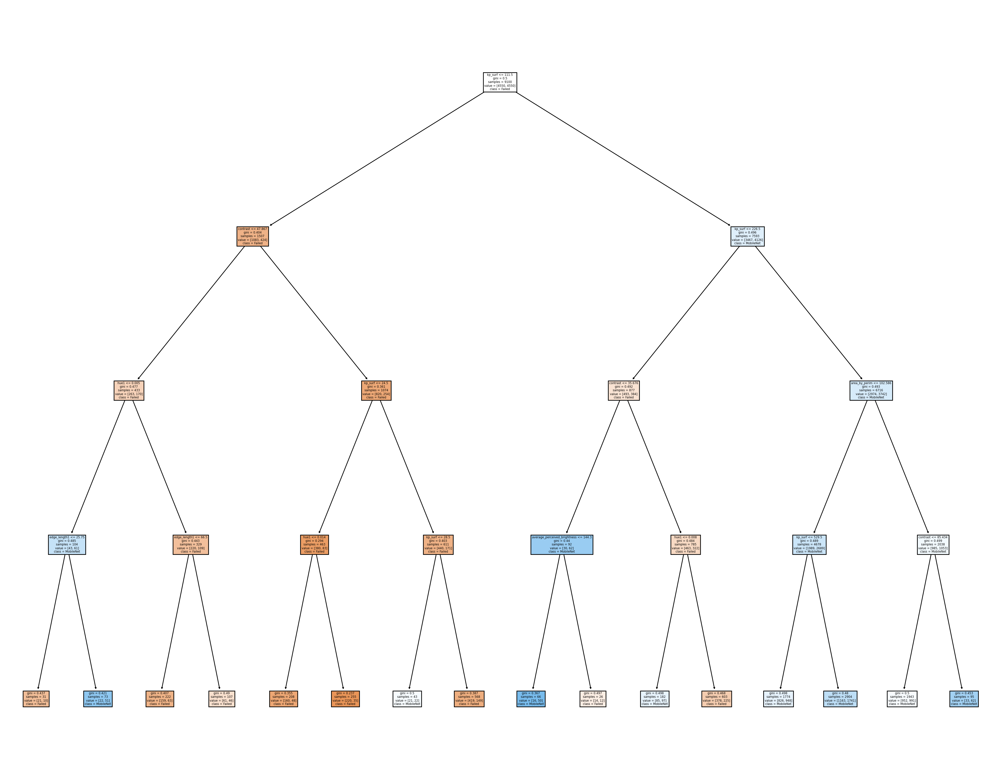

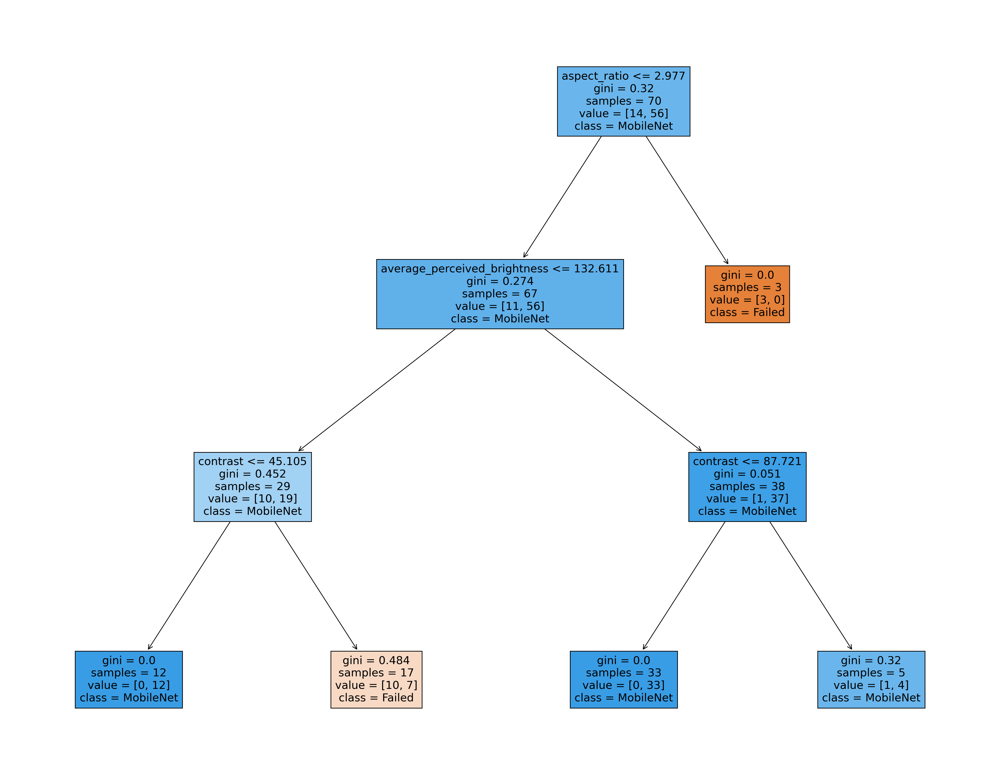

...

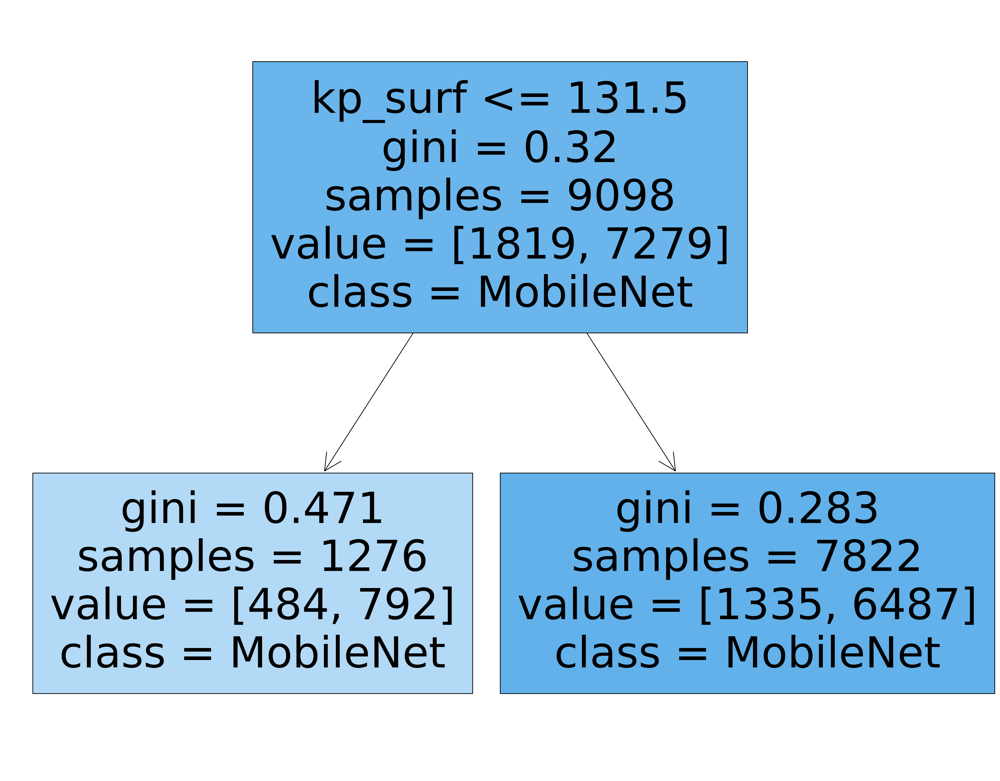

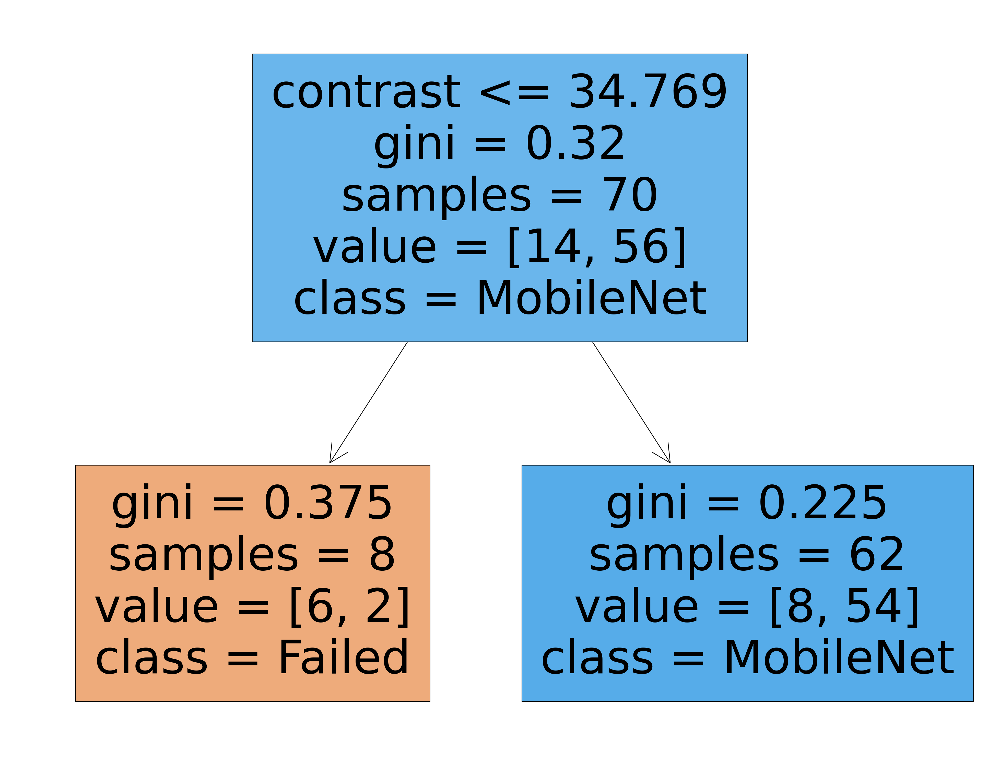

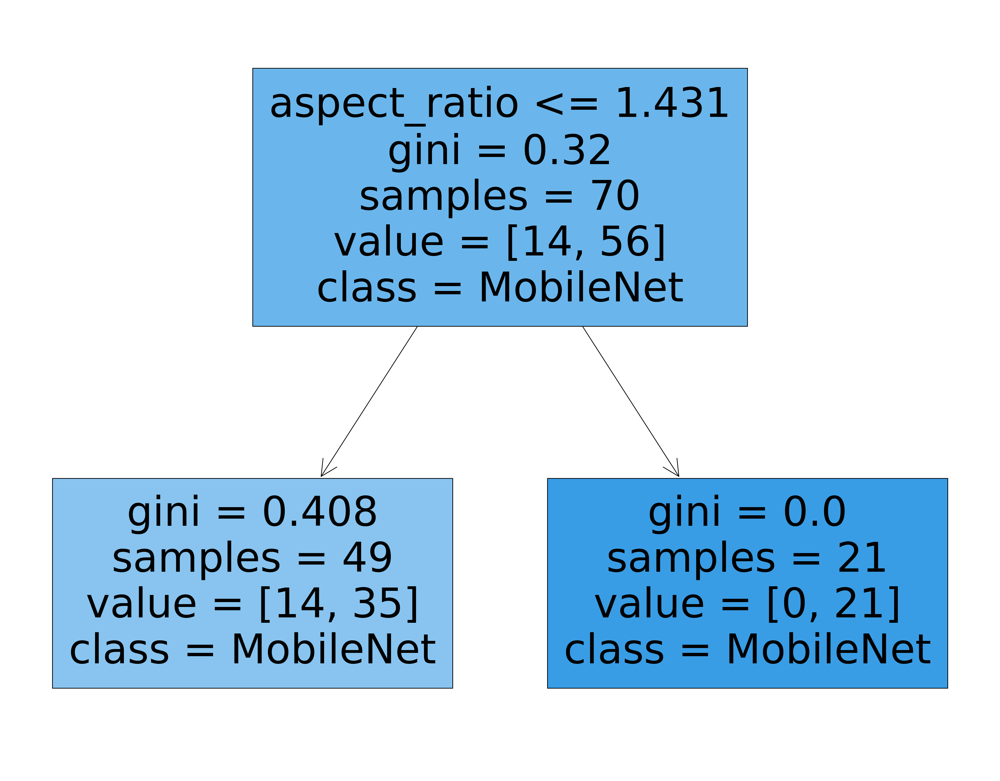

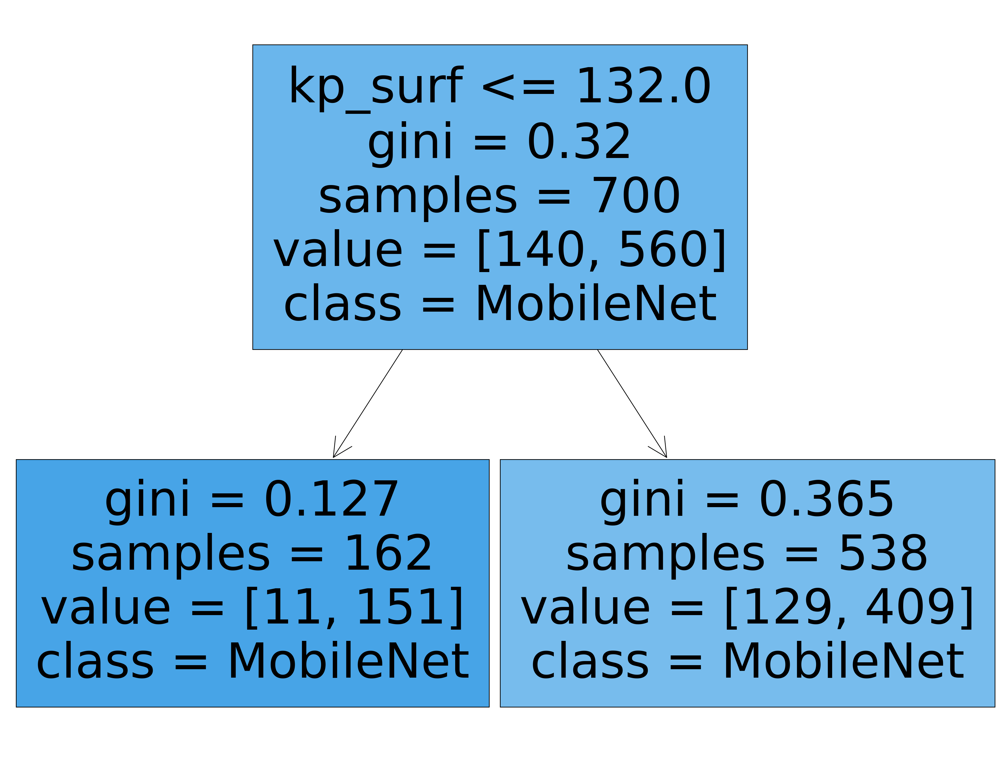

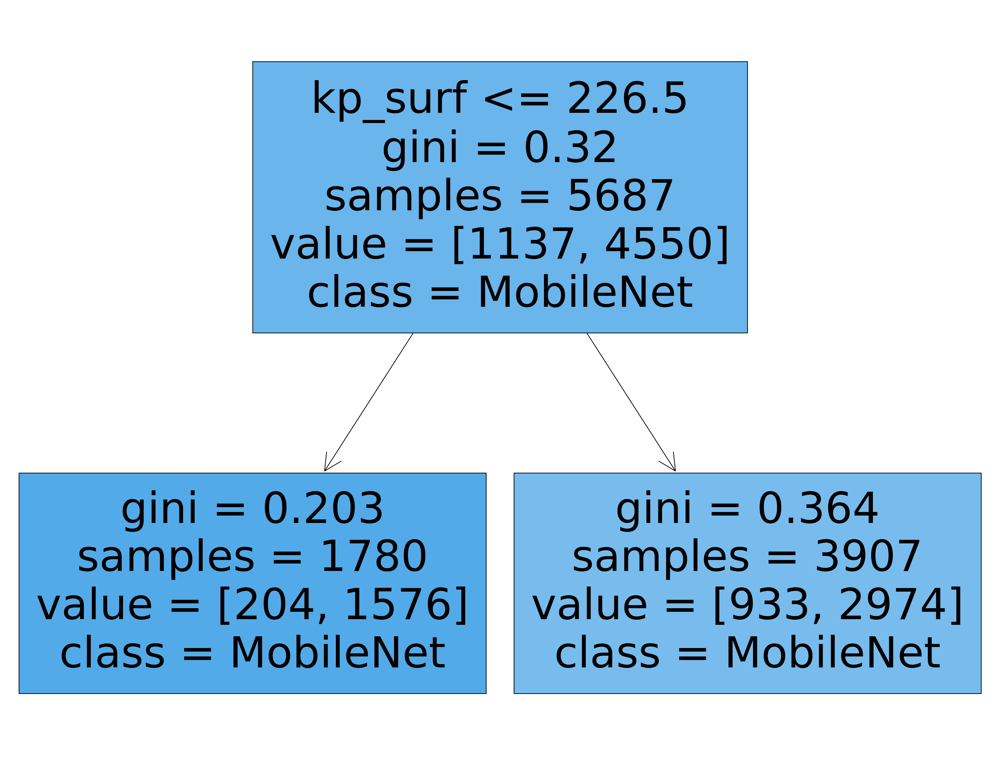

In [11]:
from sklearn.tree import plot_tree

for x in trees:
    fig = plt.figure(figsize=(25,20))
    plot_tree(x, feature_names = ['kp_surf', 'average_perceived_brightness', 'contrast', 'area_by_perim', 'aspect_ratio', 'edge_length1', 'hue1'], filled=True, class_names = ['Failed', 'MobileNet'])

In [12]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=3, cols=4,
    subplot_titles=["{} Accuracy: {}".format(x, y) for x, y in zip(datasets, accs)])
i = 0
for x in range(1, 4):
    for y in range(1, 5):
        fig.add_trace(go.Bar(x=features, y=trees[i].feature_importances_), row=x, col=y)
        i+=1

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)', height=800, width=1300, title_text="Feature Importance")
fig.update_xaxes(tickangle=45)
fig.show()

# Logistic Regression

In [13]:
i = 0
accs = []
precs = []
recs = []
lr = []
for a in [bal, unbal_mob, unbal_fail]:
    for b in a:
        train = pd.concat([b[0].head(int(len(b[0])*0.7)), b[1].head(int(len(b[1])*0.7))])
        test = pd.concat([b[0].tail(int(len(b[0])*0.3)), b[1].tail(int(len(b[1])*0.3))])
        X_train = train.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        X_test = test.drop(['Mobilenet_v1', 'Inception_v4', 'Resnet_v1_152', 'filename'], axis = 1)
        y_train = train[['Mobilenet_v1']]
        y_test = test[['Mobilenet_v1']]
        params = get_params2(X_train, y_train)
        log_reg_model = LogisticRegression(C=params["C"], 
                         penalty = params["penalty"], 
                         solver=params["solver"]).fit(X_train, y_train)
        acc, prec, rec = get_scores(datasets[i], log_reg_model, X_test, y_test)
        lr.append(log_reg_model)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec)
        i += 1

Balanced (Empirical): accuracy : precision : recall = 0.73 : 0.82 : 0.6

Balanced (Small): accuracy : precision : recall = 0.37 : 0.38 : 0.4

Balanced (Medium): accuracy : precision : recall = 0.53 : 0.52 : 0.56

Balanced (Large): accuracy : precision : recall = 0.56 : 0.57 : 0.53

Mobilenet (Empirical): accuracy : precision : recall = 0.77 : 0.81 : 0.92

MobileNet (Small): accuracy : precision : recall = 0.8 : 0.8 : 1.0

MobileNet (Medium): accuracy : precision : recall = 0.8 : 0.8 : 1.0

MobileNet (Large): accuracy : precision : recall = 0.8 : 0.8 : 1.0

Failed (Empirical): accuracy : precision : recall = 0.8 : 0.67 : 0.29

Failed (Small): accuracy : precision : recall = 0.8 : 0.0 : 0.0

Failed (Medium): accuracy : precision : recall = 0.8 : 0.0 : 0.0

Failed (Large): accuracy : precision : recall = 0.8 : 0.0 : 0.0



In [14]:
plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = datasets,
        y = accs
       )])

plot.update_layout(paper_bgcolor='rgba(0,0,0,0)', showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Accuracy")

plot.show()

plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = datasets,
        y = precs
       )])

plot.update_layout(paper_bgcolor='rgba(0,0,0,0)', showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Precision")

plot.show()

plot = go.Figure(data=[go.Bar(
        name = 'MobileNet (Easy)',
        x = datasets,
        y = recs
       )])

plot.update_layout(paper_bgcolor='rgba(0,0,0,0)', showlegend=False, barmode='stack', xaxis_title="Datasets", yaxis_title="Recall")

plot.show()

In [15]:
fig = make_subplots(
    rows=3, cols=4,
    subplot_titles=["{} Accuracy: {}".format(x, y) for x, y in zip(datasets, accs)])
i = 0
for x in range(1, 4):
    for y in range(1, 5):
        fig.add_trace(go.Bar(x=features, y=lr[i].coef_[0]), row=x, col=y)
        i+=1

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)', height=800, width=1300, title_text="Feature Weights")
fig.update_xaxes(tickangle=45)
fig.show()